# Mass Model Analysis

Diagnostic plots for the `2xlayers_b32` model.

Loads saved fold flows from `outputs/mass_model/2xlayers_b32/` — no retraining.

In [21]:
import sys
sys.path.insert(0, '../..')

import numpy as np
import pandas as pd
import torch
import pickle
import os
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

from training.constants  import LOGA_GRID, PRIOR_LOGPROT
from training.data       import load_training, make_holdout_split
from training.flow       import create_flow
from training.infer      import batch_posteriors
from training.metrics    import compute_residuals
from training.plots      import (
    set_paper_style, plot_posteriors_by_age, plot_fixed_mass_heatmap,
    plot_residual_panels, plot_cluster_residual_densities,
    plot_age_slices, plot_mass_slices, compute_prot_pdf,
)
from training.report     import coverage_report

set_paper_style()

MODEL_DIR   = '../../outputs/mass_model/2xlayers_b32_scaled'
N_FOLDS     = 5
OBS_COL     = 'log_prot'
COND_COLS   = ['log_age_myr', 'mass_msun', 'mass_msun_err_lo', 'mass_msun_err_hi']
HIDDEN      = (64, 64, 64, 64)

In [22]:
# Load data
df = load_training('../../cf_data/training_stars.csv', drop_nan_age_err=False)
train_val_df, test_df = make_holdout_split(df, test_frac=0.10)

# Load saved fold flows + scalers
fold_flows, fold_scalers = [], []
for i in range(N_FOLDS):
    flow = create_flow(n_cond=len(COND_COLS), hidden_features=HIDDEN)
    flow.load_state_dict(torch.load(f'{MODEL_DIR}/fold{i}_flow.pt', weights_only=True))
    flow.eval()
    fold_flows.append(flow)
    with open(f'{MODEL_DIR}/fold{i}_scaler.pkl', 'rb') as f:
        fold_scalers.append(pickle.load(f))

# Load saved k-fold results + posteriors
results_df       = pd.read_csv(f'{MODEL_DIR}/results.csv')
posteriors_kfold = np.load(f'{MODEL_DIR}/posteriors_kfold.npy')

print(f'Stars in train/val pool : {len(train_val_df)}')
print(f'Stars in test holdout   : {len(test_df)}')
print(f'K-fold results rows     : {len(results_df)}')
print(f'Posteriors shape        : {posteriors_kfold.shape}')

Stars in train/val pool : 5515
Stars in test holdout   : 613
K-fold results rows     : 5515
Posteriors shape        : (5515, 1000)


## 1. Density plots & model structure

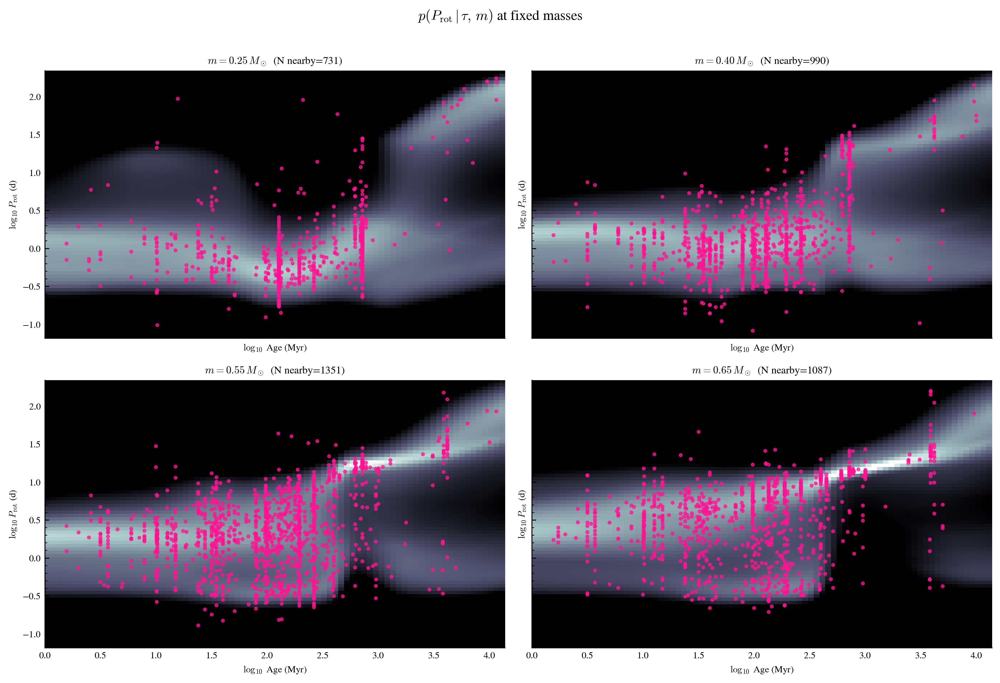

In [23]:
# 1a. Fixed-mass heatmaps: P(P_rot | age, mass) spanning the training mass range (max ~0.67 Msun)
plot_fixed_mass_heatmap(
    fold_flows, train_val_df, COND_COLS, fold_scalers,
    masses   = [0.25, 0.40, 0.55, 0.65],
    mass_tol = 0.05,
)

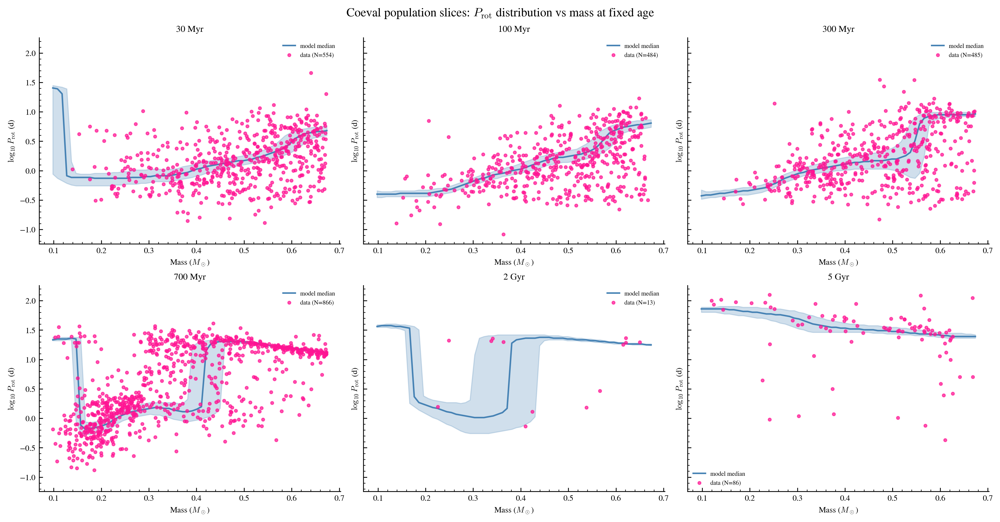

In [24]:
# 1b. Slices in age: coeval population — P_rot vs mass at fixed ages
plot_age_slices(
    fold_flows, fold_scalers, train_val_df, COND_COLS,
    ages_myr    = [30, 100, 300, 700, 2000, 5000],
    age_tol_dex = 0.10,
)

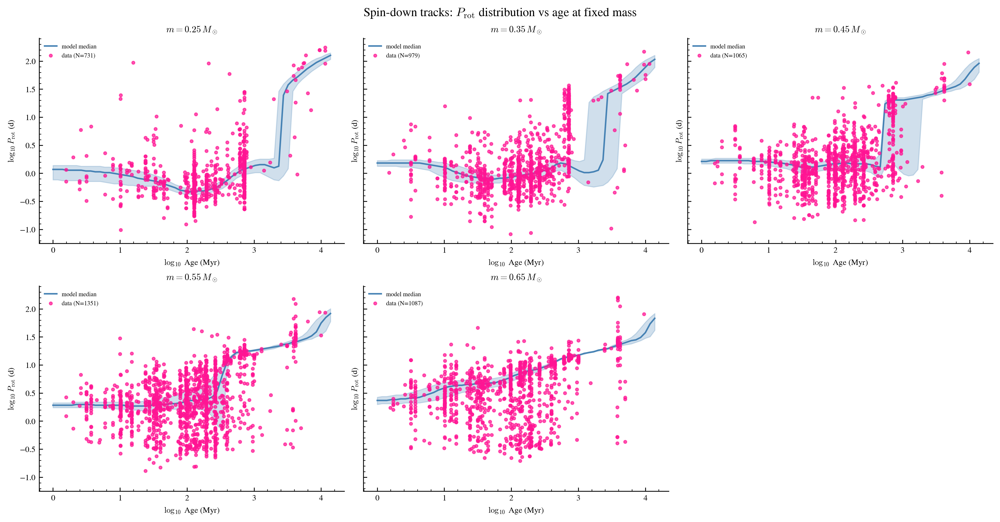

In [25]:
# 1c. Slices in mass (colour): spin-down tracks — P_rot vs age at fixed masses
plot_mass_slices(
    fold_flows, fold_scalers, train_val_df, COND_COLS,
    masses   = [0.25, 0.35, 0.45, 0.55, 0.65],
    mass_tol = 0.05,
)

## 2. Age recovery — flat prior

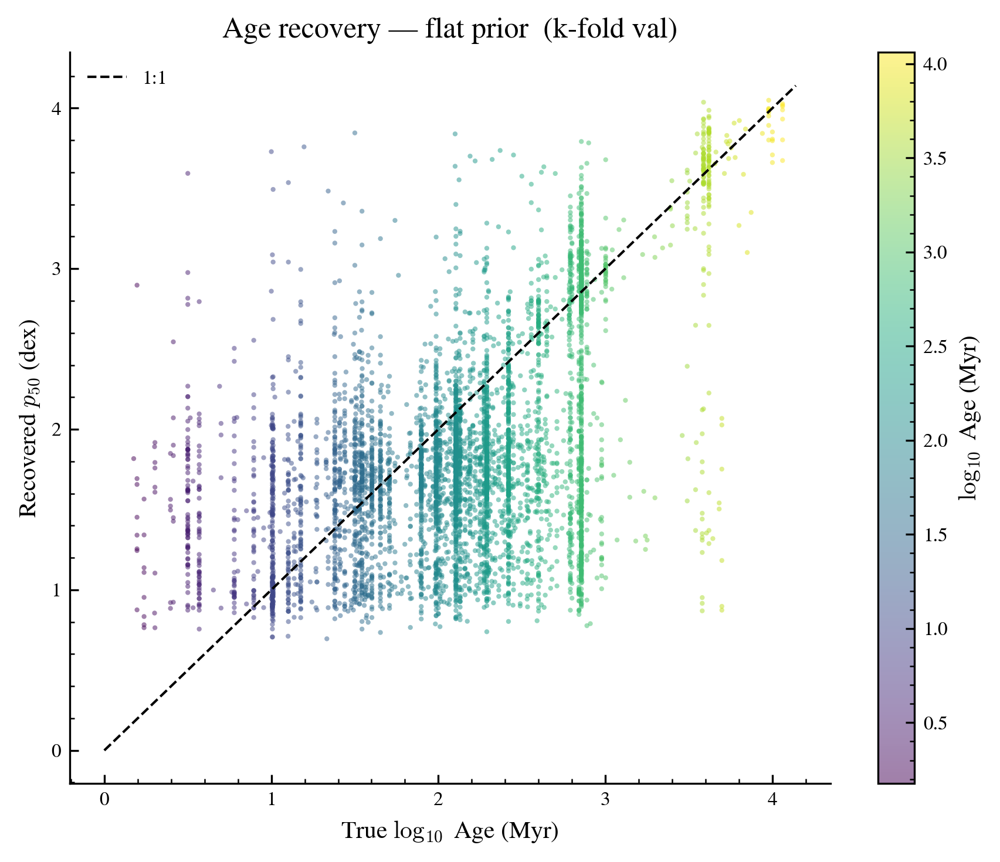

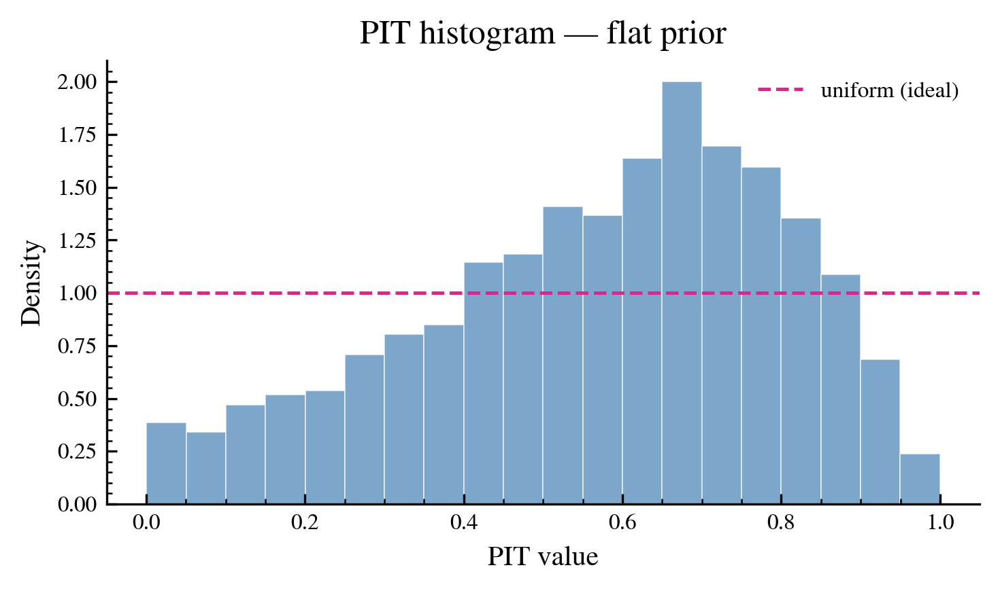

=== 68% posterior coverage check ===
N valid stars       : 5515
Observed coverage   : 0.824 (82.4%)
Expected coverage   : 0.680 +/- 0.006 (binomial 1-sigma)
Coverage offset     : +22.89 sigma
Interpretation      : over-covering; posteriors are likely too broad / conservative.


,cover68,n
fold,,
0,0.823209,1103
1,0.817770,1103
2,0.807797,1103
3,0.830462,1103
4,0.839529,1103


In [26]:
# True vs recovered age scatter (k-fold val set, flat prior)
fig, ax = plt.subplots(figsize=(6, 5))
sc = ax.scatter(results_df['log_age_myr'], results_df['p50'],
                c=results_df['log_age_myr'], cmap='viridis',
                s=4, alpha=0.5, linewidths=0)
ax.plot([LOGA_GRID[0], LOGA_GRID[-1]], [LOGA_GRID[0], LOGA_GRID[-1]],
        'k--', lw=1, label='1:1')
ax.set_xlabel(r'True $\log_{10}$ Age (Myr)')
ax.set_ylabel(r'Recovered $p_{50}$ (dex)')
ax.set_title('Age recovery — flat prior  (k-fold val)')
plt.colorbar(sc, ax=ax, label=r'$\log_{10}$ Age (Myr)')
ax.legend(frameon=False)
plt.tight_layout()
plt.show()

# PIT histogram — well-calibrated posteriors → uniform
pit_vals = []
for i, row in results_df.iterrows():
    post = posteriors_kfold[i]
    cdf  = np.cumsum(post)
    cdf /= cdf[-1]
    pit_vals.append(float(np.interp(row['log_age_myr'], LOGA_GRID, cdf)))

fig, ax = plt.subplots(figsize=(5, 3))
ax.hist(pit_vals, bins=20, density=True, color='steelblue', alpha=0.7, edgecolor='white', lw=0.4)
ax.axhline(1.0, color='deeppink', lw=1.2, ls='--', label='uniform (ideal)')
ax.set_xlabel('PIT value')
ax.set_ylabel('Density')
ax.set_title('PIT histogram — flat prior')
ax.legend(frameon=False)
plt.tight_layout()
plt.show()

coverage_report(results_df)

## 3. Age recovery — flat-in-linear-age prior

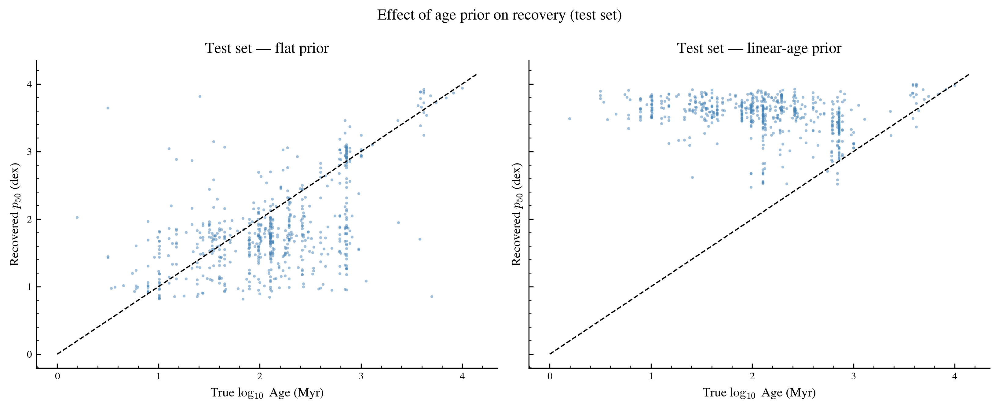

=== flat prior ===
=== 68% posterior coverage check ===
N valid stars       : 613
Observed coverage   : 0.853 (85.3%)
Expected coverage   : 0.680 +/- 0.019 (binomial 1-sigma)
Coverage offset     : +9.19 sigma
Interpretation      : over-covering; posteriors are likely too broad / conservative.

=== flat-in-linear-age prior ===
=== 68% posterior coverage check ===
N valid stars       : 613
Observed coverage   : 0.145 (14.5%)
Expected coverage   : 0.680 +/- 0.019 (binomial 1-sigma)
Coverage offset     : -28.39 sigma
Interpretation      : under-covering; posteriors are likely too narrow / overconfident.


In [27]:
# Flat-in-linear-age prior: pi(log_age) ∝ age = 10^log_age
# Downweights young ages relative to old, pushing posteriors toward older stars.
log_prior_linear = lambda x: x * np.log(10)

# Recompute on test set (613 stars — fast) for both priors
from training.metrics import compute_residuals as _cr

# Use fold 0's flow+scaler for test; average over all folds for robustness
posts_flat   = np.mean([
    batch_posteriors(flow, test_df, OBS_COL, COND_COLS, scaler,
                     log_prior_fn=None)
    for flow, scaler in zip(fold_flows, fold_scalers)
], axis=0)

posts_linear = np.mean([
    batch_posteriors(flow, test_df, OBS_COL, COND_COLS, scaler,
                     log_prior_fn=log_prior_linear)
    for flow, scaler in zip(fold_flows, fold_scalers)
], axis=0)

res_flat   = _cr(test_df, posts_flat)
res_linear = _cr(test_df, posts_linear)

fig, axes = plt.subplots(1, 2, figsize=(11, 4.5), sharey=True)
for ax, posts, res, label in [
    (axes[0], posts_flat,   res_flat,   'flat prior'),
    (axes[1], posts_linear, res_linear, 'linear-age prior'),
]:
    ax.scatter(test_df['log_age_myr'].values, res['p50'].values,
               s=5, alpha=0.5, color='steelblue', linewidths=0)
    ax.plot([LOGA_GRID[0], LOGA_GRID[-1]], [LOGA_GRID[0], LOGA_GRID[-1]],
            'k--', lw=1)
    ax.set_xlabel(r'True $\log_{10}$ Age (Myr)')
    ax.set_ylabel(r'Recovered $p_{50}$ (dex)')
    ax.set_title(f'Test set — {label}')
plt.suptitle('Effect of age prior on recovery (test set)')
plt.tight_layout()
plt.show()

print('=== flat prior ===')
coverage_report(res_flat)
print('\n=== flat-in-linear-age prior ===')
coverage_report(res_linear)

## 4. Sample age posteriors

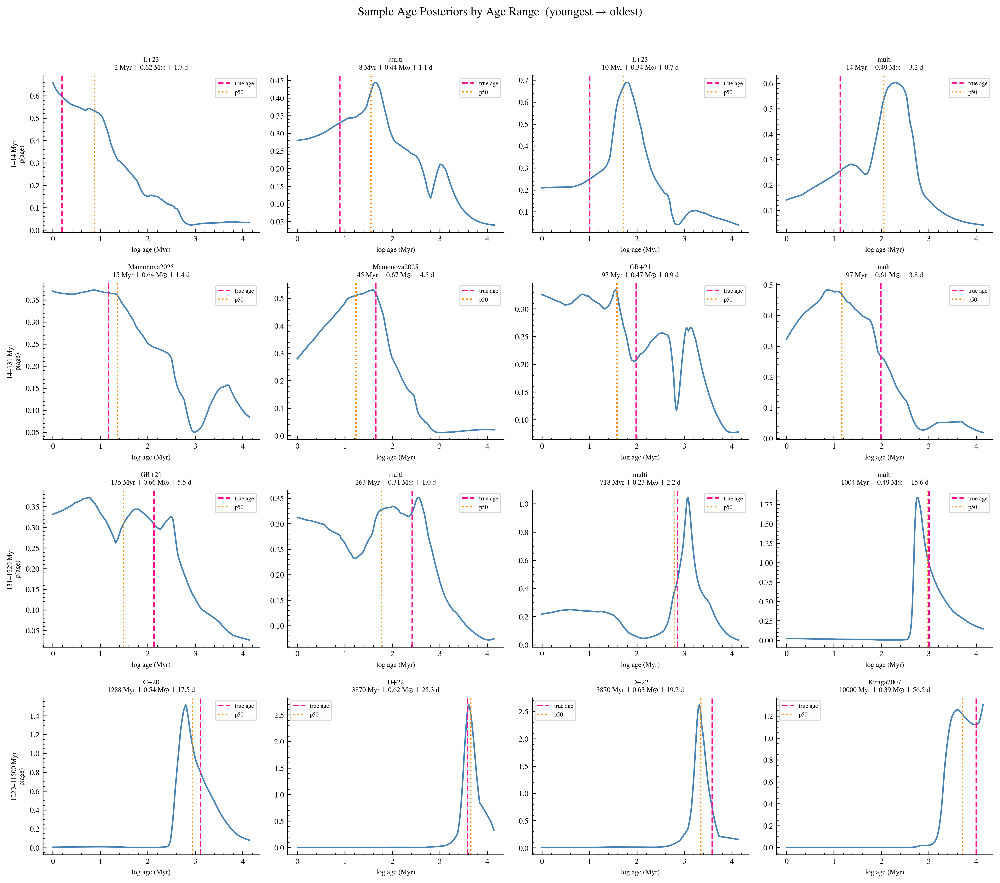

In [28]:
# 4a. 4×4 grid across the k-fold val set, organised by age range
plot_posteriors_by_age(posteriors_kfold, LOGA_GRID, results_df, n_rows=4, n_cols=4)

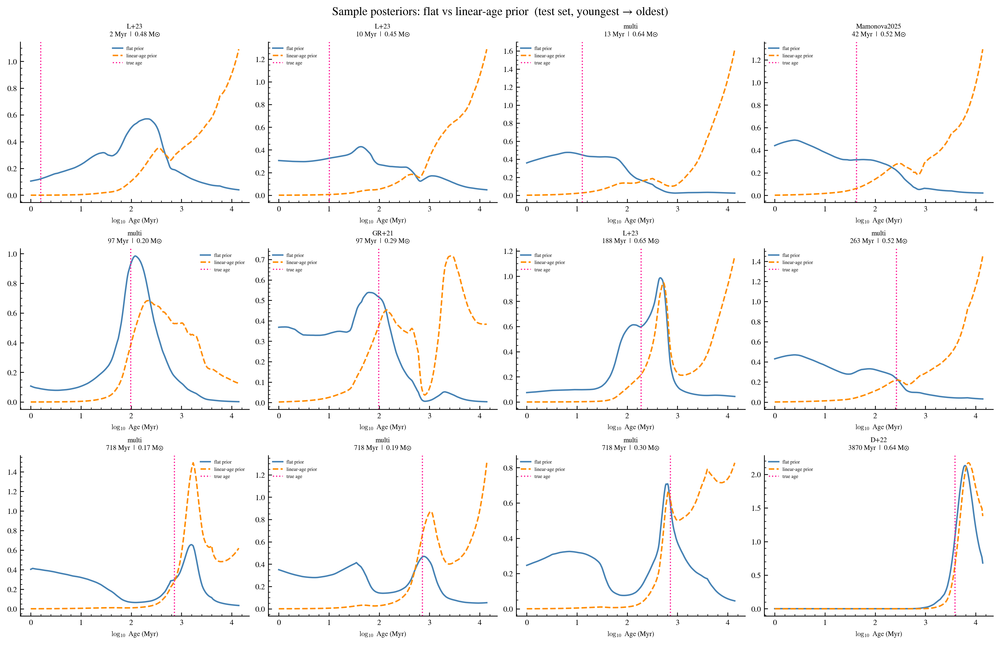

In [29]:
# 4b. Side-by-side flat vs linear-age prior for 12 test stars spanning age/mass
_field = {'MOCADB', 'Engle2023', 'LWRD', 'Pass2022'}
_cluster_mask = ~test_df['source_paper'].isin(_field)
_pool_pos  = np.where(_cluster_mask.values)[0]       # positional indices into test_df
_pool      = test_df[_cluster_mask].copy().reset_index(drop=True)
_age_order = np.argsort(_pool['log_age_myr'].values)
_pick_idx  = _age_order[np.linspace(0, len(_age_order) - 1, 12, dtype=int)]
_pick_df   = _pool.iloc[_pick_idx].reset_index(drop=True)
_orig_idx  = list(_pool_pos[_pick_idx])              # correct positional indices into test_df

n_cols, n_rows = 4, 3
fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 3), layout='constrained')
axes = axes.flatten()

for ax, local_i, (_, row) in zip(axes, _orig_idx, _pick_df.iterrows()):
    ax.plot(LOGA_GRID, posts_flat[local_i],   color='steelblue',  lw=1.5, label='flat prior')
    ax.plot(LOGA_GRID, posts_linear[local_i], color='darkorange', lw=1.5, ls='--', label='linear-age prior')
    ax.axvline(row['log_age_myr'], color='deeppink', lw=1.2, ls=':', label='true age')
    ax.set_title(
        f"{row['source_paper']}\n"
        f"{10**row['log_age_myr']:.0f} Myr  |  {row['mass_msun']:.2f} M☉",
        fontsize=7,
    )
    ax.set_xlabel(r'$\log_{10}$ Age (Myr)', fontsize=7)
    ax.legend(fontsize=5, frameon=False)

fig.suptitle('Sample posteriors: flat vs linear-age prior  (test set, youngest → oldest)')
plt.show()

## 5. Residual analysis

/Users/alanxia/Documents/GitHub/cf_xmatch/training/notebooks/../../training/plots.py:287: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.scatter(xvals, resid, **_kw_scat)


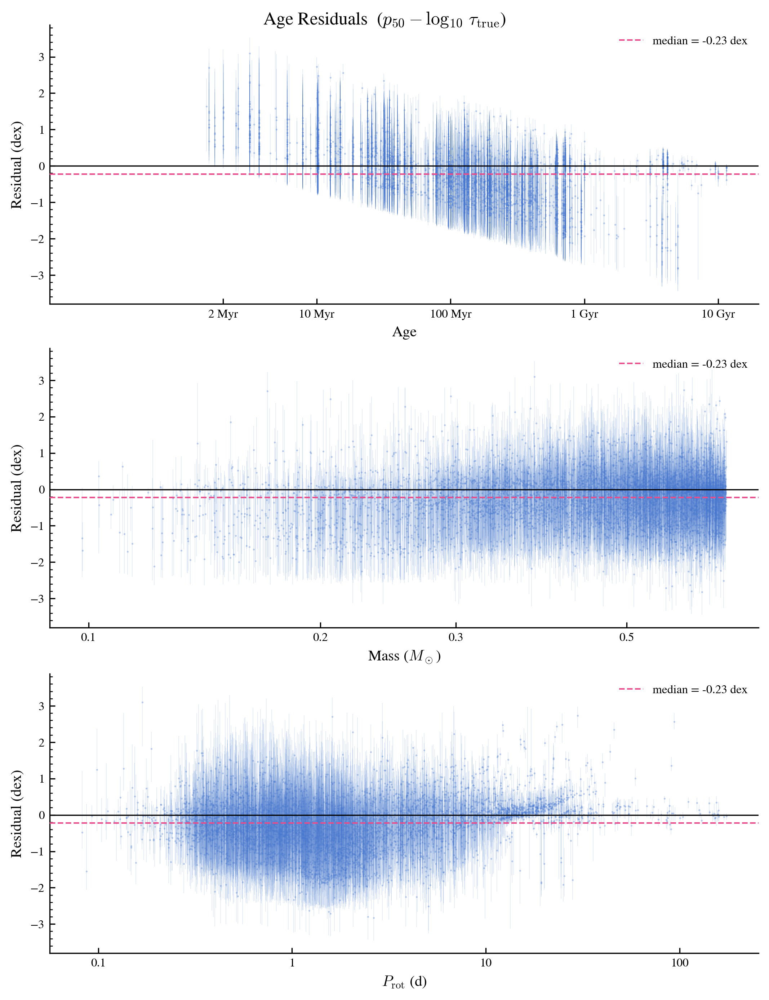

In [30]:
# 5a. Three-panel residual figure (age / mass / P_rot)
plot_residual_panels(results_df)

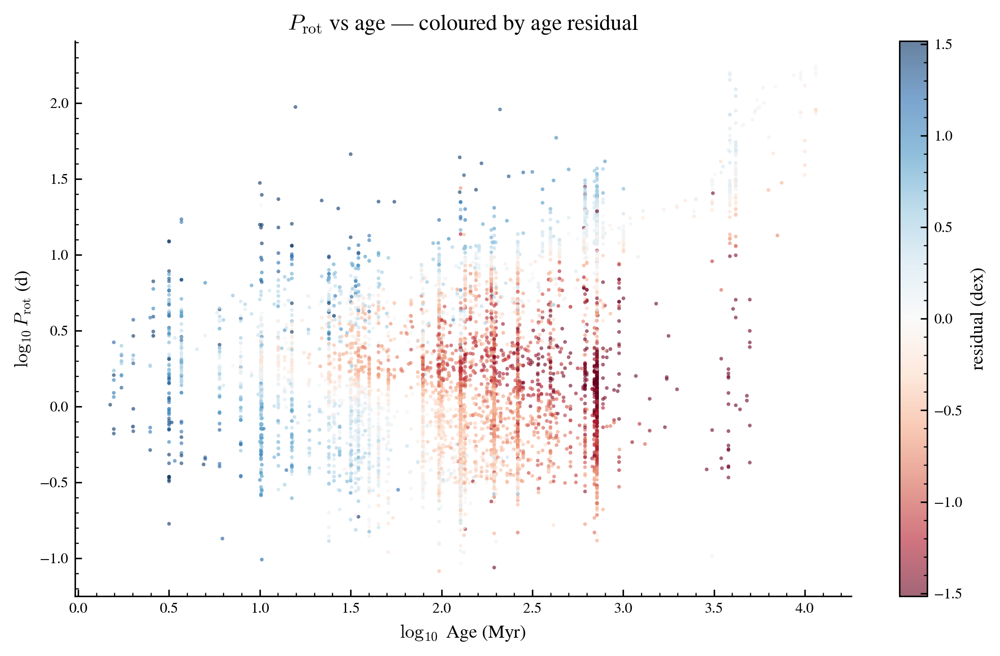

In [31]:
# 5b. P_rot vs age scatter, colour-coded by residual
fig, ax = plt.subplots(figsize=(8, 5))
vlim = results_df['residual_dex'].abs().quantile(0.95)
sc = ax.scatter(
    results_df['log_age_myr'], results_df['log_prot'],
    c=results_df['residual_dex'], cmap='RdBu',
    vmin=-vlim, vmax=vlim, s=4, alpha=0.6, linewidths=0,
)
plt.colorbar(sc, ax=ax, label='residual (dex)')
ax.set_xlabel(r'$\log_{10}$ Age (Myr)')
ax.set_ylabel(r'$\log_{10} P_\mathrm{rot}$ (d)')
ax.set_title(r'$P_\mathrm{rot}$ vs age — coloured by age residual')
plt.tight_layout()
plt.show()

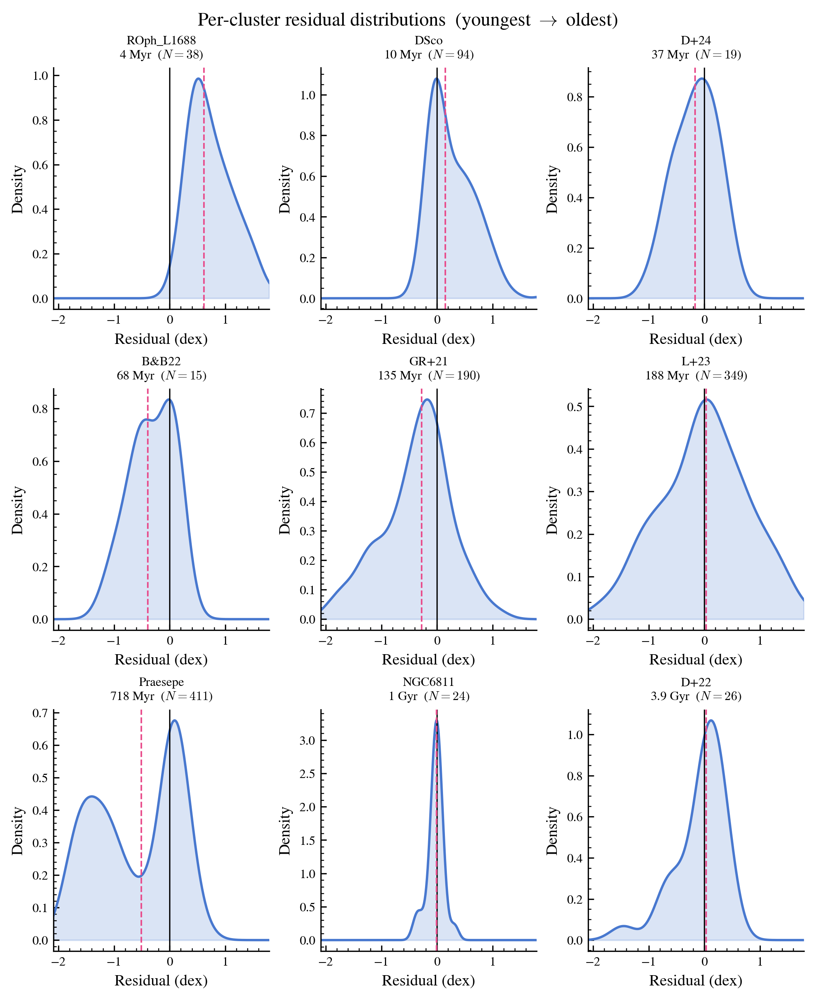

In [32]:
# 5c. Per-cluster residual KDE distributions
plot_cluster_residual_densities(results_df, n_clusters=9)

## 6. Precision & accuracy maps

In [ ]:
_rd = results_df.copy()
_rd['precision'] = _rd['p84'] - _rd['p16']

age_bins  = np.linspace(_rd['log_age_myr'].min(), _rd['log_age_myr'].max(), 10)
mass_bins = np.linspace(_rd['mass_msun'].min(),   _rd['mass_msun'].max(),   8)

MIN_N = 5

acc_grid  = np.full((len(age_bins)-1, len(mass_bins)-1), np.nan)
prec_grid = acc_grid.copy()
n_grid    = np.zeros_like(acc_grid)

for i in range(len(age_bins)-1):
    for j in range(len(mass_bins)-1):
        mask = (
            (_rd['log_age_myr'] >= age_bins[i])  & (_rd['log_age_myr'] < age_bins[i+1]) &
            (_rd['mass_msun']   >= mass_bins[j])  & (_rd['mass_msun']   < mass_bins[j+1])
        )
        n_grid[i, j] = mask.sum()
        if mask.sum() >= MIN_N:
            acc_grid[i, j]  = _rd.loc[mask, 'residual_dex'].median()
            prec_grid[i, j] = _rd.loc[mask, 'precision'].median()

age_ctrs  = 0.5 * (age_bins[:-1] + age_bins[1:])
mass_ctrs = 0.5 * (mass_bins[:-1] + mass_bins[1:])
age_labels  = [f'{10**a:.0f}' for a in age_ctrs]
mass_labels = [f'{m:.2f}' for m in mass_ctrs]

fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))

vlim = np.nanmax(np.abs(acc_grid))
im0 = axes[0].imshow(acc_grid, origin='lower', aspect='auto', cmap='RdBu',
                      vmin=-vlim, vmax=vlim)
plt.colorbar(im0, ax=axes[0], label='Median residual (dex)')
for i in range(acc_grid.shape[0]):
    for j in range(acc_grid.shape[1]):
        axes[0].text(j, i, f'{int(n_grid[i,j])}', ha='center', va='center',
                     fontsize=5, color='gray')
axes[0].set_xticks(range(len(mass_ctrs))); axes[0].set_xticklabels(mass_labels, fontsize=7)
axes[0].set_yticks(range(len(age_ctrs)));  axes[0].set_yticklabels(age_labels,  fontsize=7)
axes[0].set_xlabel(r'Mass ($M_\odot$)')
axes[0].set_ylabel('Age (Myr)')
axes[0].set_title(f'Accuracy  (N$\geq${MIN_N} per cell)')

im1 = axes[1].imshow(prec_grid, origin='lower', aspect='auto', cmap='viridis_r')
plt.colorbar(im1, ax=axes[1], label='Median precision p84−p16 (dex)')
for i in range(prec_grid.shape[0]):
    for j in range(prec_grid.shape[1]):
        axes[1].text(j, i, f'{int(n_grid[i,j])}', ha='center', va='center',
                     fontsize=5, color='gray')
axes[1].set_xticks(range(len(mass_ctrs))); axes[1].set_xticklabels(mass_labels, fontsize=7)
axes[1].set_yticks(range(len(age_ctrs)));  axes[1].set_yticklabels(age_labels,  fontsize=7)
axes[1].set_xlabel(r'Mass ($M_\odot$)')
axes[1].set_ylabel('Age (Myr)')
axes[1].set_title(f'Precision  (N$\geq${MIN_N} per cell)')

plt.suptitle('Accuracy & precision in (age, mass) space')
plt.tight_layout()
plt.show()

## 7. Fast vs slow rotator analysis

/var/folders/8q/8t0cm1_d2rldpq2v7kdzgpfw0000gn/T/ipykernel_54310/364210845.py:42: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=6, frameon=False)
/var/folders/8q/8t0cm1_d2rldpq2v7kdzgpfw0000gn/T/ipykernel_54310/364210845.py:42: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=6, frameon=False)


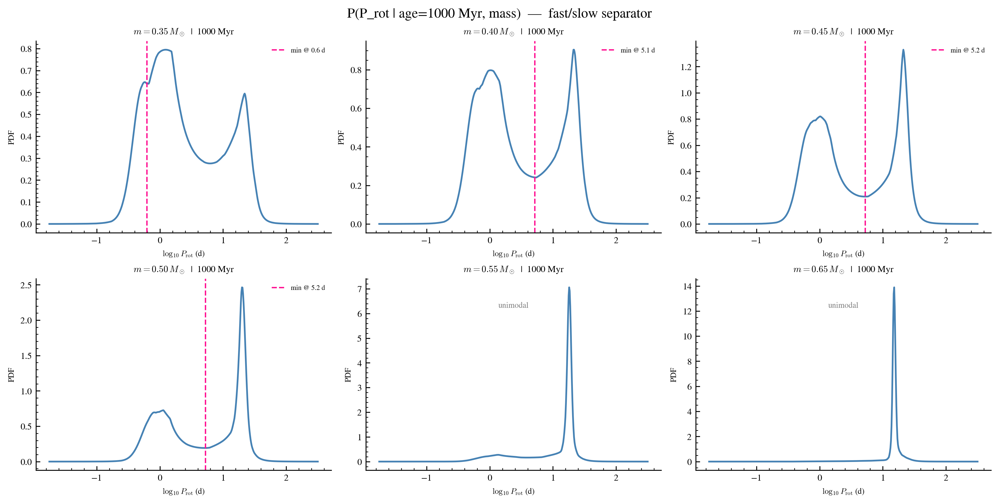

In [34]:
# 7a. P_rot PDFs at fixed age — find minimum between fast/slow peaks
from scipy.signal import find_peaks, savgol_filter

_age_check   = 1000  # Myr — old enough to show bimodality
_masses_fs   = [0.35, 0.40, 0.45, 0.50, 0.55, 0.65]
logprot_fine = np.linspace(PRIOR_LOGPROT[0], PRIOR_LOGPROT[1], 500)

fig, axes = plt.subplots(2, 3, figsize=(12, 6), layout='constrained')
axes = axes.flatten()

separators = {}
for ax, mass in zip(axes, _masses_fs):
    _, pdf = compute_prot_pdf(fold_flows, fold_scalers, _age_check, mass,
                               COND_COLS, train_val_df, logprot_fine)
    ax.plot(logprot_fine, pdf, color='steelblue', lw=1.5)

    # Smooth lightly to avoid noise confusing peak detection
    pdf_smooth = savgol_filter(pdf, window_length=21, polyorder=3)

    # Find peaks with at least 5% of max height and separated by ≥20 grid points
    peaks, _ = find_peaks(pdf_smooth,
                          height=0.05 * pdf_smooth.max(),
                          distance=20)

    if len(peaks) >= 2:
        # Take the two tallest peaks
        top2       = peaks[np.argsort(pdf_smooth[peaks])[-2:]]
        left_peak, right_peak = int(top2.min()), int(top2.max())
        # Minimum between them
        valley_idx = left_peak + int(np.argmin(pdf_smooth[left_peak:right_peak + 1]))
        sep        = float(logprot_fine[valley_idx])
        separators[mass] = sep
        ax.axvline(sep, color='deeppink', lw=1.2, ls='--',
                   label=f'min @ {10**sep:.1f} d')
    elif len(peaks) == 1:
        ax.text(0.5, 0.85, 'unimodal', transform=ax.transAxes,
                ha='center', fontsize=7, color='gray')

    ax.set_title(f'$m={mass:.2f}\\,M_\\odot$  |  {_age_check} Myr', fontsize=8)
    ax.set_xlabel(r'$\log_{10} P_\mathrm{rot}$ (d)', fontsize=7)
    ax.set_ylabel('PDF', fontsize=7)
    ax.legend(fontsize=6, frameon=False)

fig.suptitle(f'P(P_rot | age={_age_check} Myr, mass)  —  fast/slow separator')
plt.show()

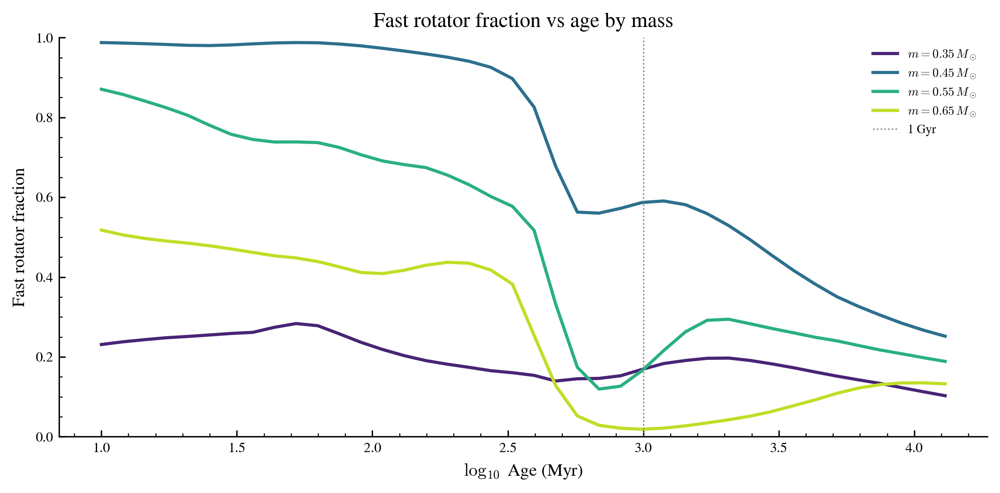

In [35]:
# 7b. Fast fraction vs age for each mass bin
_ages_myr  = np.logspace(1, np.log10(13000), 40)
_masses_fb = [0.35, 0.45, 0.55, 0.65]
_colors    = plt.cm.viridis(np.linspace(0.1, 0.9, len(_masses_fb)))

fig, ax = plt.subplots(figsize=(8, 4))
for mass, col in zip(_masses_fb, _colors):
    sep = separators.get(mass, 0.5)
    fast_fracs = []
    for age_myr in _ages_myr:
        lp, pdf = compute_prot_pdf(fold_flows, fold_scalers, age_myr, mass,
                                    COND_COLS, train_val_df, logprot_fine)
        fast_mask  = lp <= sep
        fast_frac  = np.trapz(pdf[fast_mask], lp[fast_mask]) if fast_mask.any() else 0.0
        fast_fracs.append(float(np.clip(fast_frac, 0, 1)))
    ax.plot(np.log10(_ages_myr), fast_fracs, color=col, lw=1.8,
            label=f'$m={mass:.2f}\\,M_\\odot$')

ax.axvline(3.0, color='gray', lw=0.8, ls=':', label='1 Gyr')
ax.set_xlabel(r'$\log_{10}$ Age (Myr)')
ax.set_ylabel('Fast rotator fraction')
ax.set_title('Fast rotator fraction vs age by mass')
ax.legend(fontsize=7, frameon=False)
ax.set_ylim(0, 1)
plt.tight_layout()
plt.show()

In [36]:
# 7c. Field-age fast fraction: integrate over flat-in-linear-age prior, age > 1 Gyr
field_loga    = np.linspace(3.0, np.log10(13000), 30)
field_ages    = 10 ** field_loga
prior_weights = field_ages / field_ages.sum()  # flat-in-linear-age weighting

field_fast = {}
for mass in _masses_fb:
    sep = separators.get(mass, 0.5)
    fracs = []
    for age_myr in field_ages:
        lp, pdf = compute_prot_pdf(fold_flows, fold_scalers, age_myr, mass,
                                    COND_COLS, train_val_df, logprot_fine)
        fast_mask = lp <= sep
        fracs.append(float(np.clip(np.trapz(pdf[fast_mask], lp[fast_mask])
                                   if fast_mask.any() else 0.0, 0, 1)))
    field_fast[mass] = float(np.average(fracs, weights=prior_weights))

print('Expected fast rotator fraction at field ages (1–13 Gyr):')
for mass, ff in field_fast.items():
    print(f'  m = {mass:.2f} M☉   fast fraction = {ff:.3f}  ({ff*100:.1f}%)')

# Mass-integrated: average across mass bins weighted by a Kroupa-like proxy
# (more low-mass stars) — use 1/mass as a rough IMF weight
mass_arr    = np.array(list(field_fast.keys()))
ff_arr      = np.array(list(field_fast.values()))
imf_weights = (1.0 / mass_arr)
imf_weights /= imf_weights.sum()
field_fast_avg = float(np.dot(ff_arr, imf_weights))
print(f'\nMass-integrated field fast fraction (IMF-weighted): {field_fast_avg:.3f}  ({field_fast_avg*100:.1f}%)')
print(f'Mass-integrated field fast fraction (equal weight): {ff_arr.mean():.3f}  ({ff_arr.mean()*100:.1f}%)')

Expected fast rotator fraction at field ages (1–13 Gyr):
  m = 0.35 M☉   fast fraction = 0.141  (14.1%)
  m = 0.45 M☉   fast fraction = 0.345  (34.5%)
  m = 0.55 M☉   fast fraction = 0.226  (22.6%)
  m = 0.65 M☉   fast fraction = 0.108  (10.8%)

Mass-integrated field fast fraction (IMF-weighted): 0.207  (20.7%)
Mass-integrated field fast fraction (equal weight): 0.205  (20.5%)


## 8. Fully convective boundary (0.3–0.4 M☉)

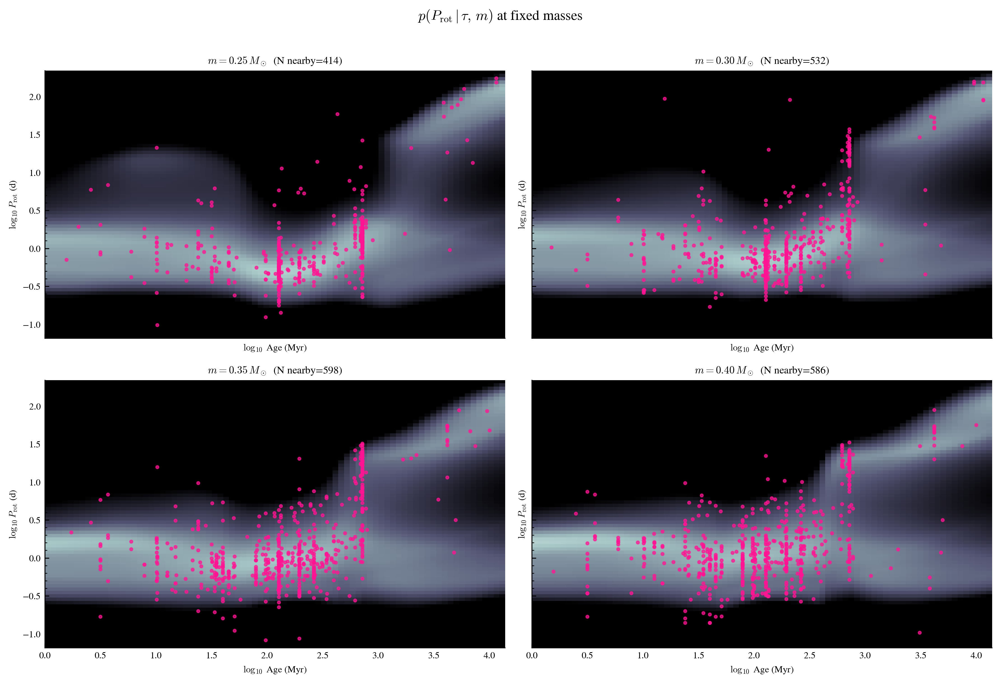

In [37]:
# 8a. Fixed-mass heatmap zoomed to FC boundary masses
plot_fixed_mass_heatmap(
    fold_flows, train_val_df, COND_COLS, fold_scalers,
    masses   = [0.25, 0.30, 0.35, 0.40],
    mass_tol = 0.03,
)

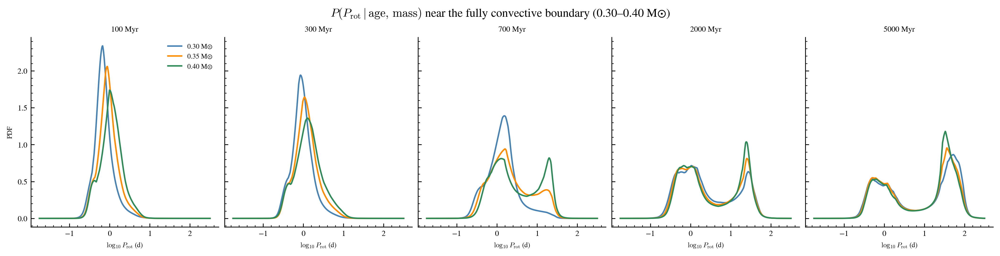

In [38]:
# 8b. P_rot PDFs at representative ages for FC-boundary stars
_fc_ages_myr = [100, 300, 700, 2000, 5000]
_fc_masses   = [0.30, 0.35, 0.40]
_fc_colors   = ['steelblue', 'darkorange', 'seagreen']

fig, axes = plt.subplots(1, len(_fc_ages_myr), figsize=(14, 3.5),
                          sharey=True, layout='constrained')
for ax, age_myr in zip(axes, _fc_ages_myr):
    for mass, col in zip(_fc_masses, _fc_colors):
        lp, pdf = compute_prot_pdf(fold_flows, fold_scalers, age_myr, mass,
                                    COND_COLS, train_val_df, logprot_fine)
        ax.plot(logprot_fine, pdf, color=col, lw=1.5, label=f'{mass:.2f} M☉')
    ax.set_title(f'{age_myr} Myr', fontsize=8)
    ax.set_xlabel(r'$\log_{10} P_\mathrm{rot}$ (d)', fontsize=7)
axes[0].set_ylabel('PDF', fontsize=7)
axes[0].legend(fontsize=7, frameon=False)
fig.suptitle(r'$P(P_\mathrm{rot}\,|\,\mathrm{age,\,mass})$ near the fully convective boundary (0.30–0.40 M☉)')
plt.show()

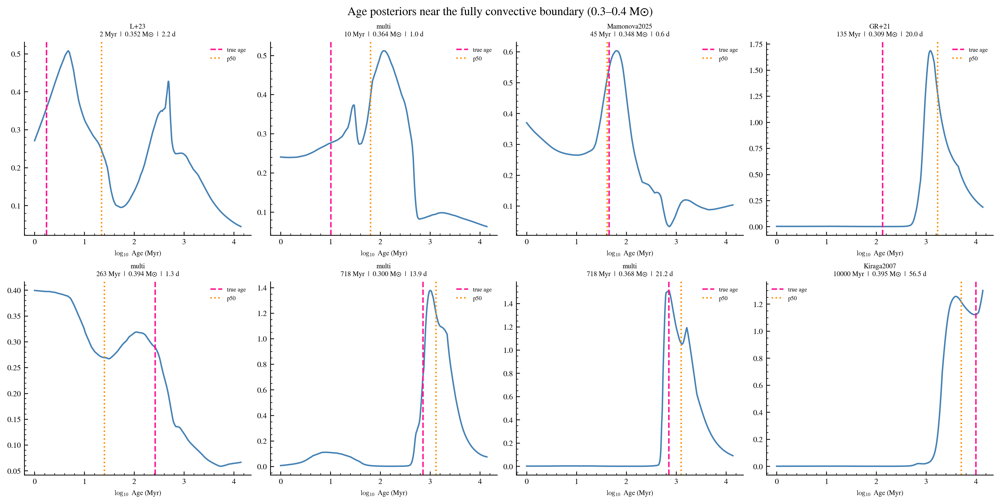

In [39]:
# 8c. Individual posteriors for FC-boundary stars in the val set
fc_mask = (results_df['mass_msun'] >= 0.3) & (results_df['mass_msun'] <= 0.4)
fc_df   = results_df[fc_mask].reset_index(drop=True)
fc_pos  = np.where(fc_mask.values)[0]

_field_src = {'MOCADB', 'Engle2023', 'LWRD', 'Pass2022'}
is_cluster = ~fc_df['source_paper'].isin(_field_src)
pool_idx   = np.where(is_cluster)[0] if is_cluster.sum() >= 8 else np.arange(len(fc_df))
age_ord    = pool_idx[np.argsort(fc_df.iloc[pool_idx]['log_age_myr'].values)]
pick       = age_ord[np.linspace(0, len(age_ord) - 1, min(8, len(age_ord)), dtype=int)]

n_pick = len(pick)
n_cols = 4
n_rows = int(np.ceil(n_pick / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 3.5), layout='constrained')
axes = np.array(axes).flatten()

for ax, i in zip(axes, pick):
    row  = fc_df.iloc[i]
    pidx = fc_pos[i]
    ax.plot(LOGA_GRID, posteriors_kfold[pidx], color='steelblue', lw=1.5)
    ax.axvline(row['log_age_myr'], color='deeppink',  lw=1.5, ls='--', label='true age')
    ax.axvline(row['p50'],         color='darkorange', lw=1.5, ls=':',  label='p50')
    ax.set_title(
        f"{row['source_paper']}\n"
        f"{10**row['log_age_myr']:.0f} Myr  |  {row['mass_msun']:.3f} M☉  |  {row['prot_days']:.1f} d",
        fontsize=7,
    )
    ax.set_xlabel(r'$\log_{10}$ Age (Myr)', fontsize=7)
    ax.legend(fontsize=6, frameon=False)

for ax in axes[n_pick:]:
    ax.set_visible(False)

fig.suptitle('Age posteriors near the fully convective boundary (0.3–0.4 M☉)')
plt.show()